In [1]:
import pandas as pd
import numpy as np
import os
import glob as gb
import matplotlib.pyplot as plt
import seaborn as sns
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D,BatchNormalization,GlobalAveragePooling2D
import cv2
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
!pip install -q kaggle
from google.colab import files
uploaded = files.upload()

Saving kaggle.json to kaggle (1).json


In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:

! kaggle datasets list

In [2]:
!kaggle datasets download -d puneet6060/intel-image-classification
!unzip intel-image-classification.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/seg_train/seg_train/mountain/7506.jpg  
  inflating: /content/seg_train/seg_train/mountain/7537.jpg  
  inflating: /content/seg_train/seg_train/mountain/7539.jpg  
  inflating: /content/seg_train/seg_train/mountain/7551.jpg  
  inflating: /content/seg_train/seg_train/mountain/7560.jpg  
  inflating: /content/seg_train/seg_train/mountain/7565.jpg  
  inflating: /content/seg_train/seg_train/mountain/7578.jpg  
  inflating: /content/seg_train/seg_train/mountain/7581.jpg  
  inflating: /content/seg_train/seg_train/mountain/7586.jpg  
  inflating: /content/seg_train/seg_train/mountain/7647.jpg  
  inflating: /content/seg_train/seg_train/mountain/7652.jpg  
  inflating: /content/seg_train/seg_train/mountain/7654.jpg  
  inflating: /content/seg_train/seg_train/mountain/7662.jpg  
  inflating: /content/seg_train/seg_train/mountain/767.jpg  
  inflating: /content/seg_train/seg_train/mountain/7672.jpg  
  inflating: /conten

In [28]:
train_path='/content/seg_train/seg_train'
test_path='/content/seg_test/seg_test'

In [ ]:

for folder in os.listdir(train_path):
  files=gb.glob(pathname=str(train_path +f"/{folder}/"+'/*.jpg'))
  print(f"for train data , found {len(files)} in folder {folder}")

for train data , found 2274 in folder sea
for train data , found 2271 in folder forest
for train data , found 2512 in folder mountain
for train data , found 2191 in folder buildings
for train data , found 2404 in folder glacier
for train data , found 2382 in folder street


In [ ]:
for folder in os.listdir(test_path):
  files=gb.glob(pathname=str(test_path +f"/{folder}/"+'/*.jpg'))
  print(f"for test data , found {len(files)} in folder {folder}")

for test data , found 553 in folder glacier
for test data , found 474 in folder forest
for test data , found 510 in folder sea
for test data , found 437 in folder buildings
for test data , found 525 in folder mountain
for test data , found 501 in folder street


In [4]:
pred_path='/content/seg_pred/seg_pred'
files=gb.glob(pathname=str(pred_path +'/*.jpg'))
print(f"for predict data , found {len(files)} ")

for predict data , found 7301 


In [ ]:
images_size=[]
for folder in os.listdir(train_path):
  files=gb.glob(pathname=str(train_path +f"/{folder}/"+'/*.jpg'))
  for img in files:
    image=plt.imread(img)
    images_size.append(image.shape)
pd.Series(images_size).value_counts()

,count
"(150, 150, 3)",13986
"(113, 150, 3)",7
"(135, 150, 3)",3
"(111, 150, 3)",3
"(144, 150, 3)",2
"(136, 150, 3)",2
"(108, 150, 3)",2
"(142, 150, 3)",2
"(143, 150, 3)",2
"(146, 150, 3)",2


In [ ]:
images_size=[]
for folder in os.listdir(test_path):
  files=gb.glob(pathname=str(test_path +f"/{folder}/"+'/*.jpg'))
  for img in files:
    image=plt.imread(img)
    images_size.append(image.shape)
pd.Series(images_size).value_counts()

,count
"(150, 150, 3)",2993
"(110, 150, 3)",1
"(72, 150, 3)",1
"(76, 150, 3)",1
"(149, 150, 3)",1
"(141, 150, 3)",1
"(81, 150, 3)",1
"(131, 150, 3)",1


In [ ]:
images_size=[]

files=gb.glob(pathname=str(pred_path +'/*.jpg'))
for img in files:
  image=plt.imread(img)
  images_size.append(image.shape)
pd.Series(images_size).value_counts()

,count
"(150, 150, 3)",7288
"(126, 150, 3)",1
"(108, 150, 3)",1
"(374, 500, 3)",1
"(149, 150, 3)",1
"(139, 150, 3)",1
"(100, 150, 3)",1
"(131, 150, 3)",1
"(112, 150, 3)",1
"(143, 150, 3)",1


In [5]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}
def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

In [6]:
s=100

In [29]:
x_train=[]
y_train=[]
for folder in os.listdir(train_path):
  files=gb.glob(pathname=str(train_path +f"/{folder}/"+'/*.jpg'))
  for img in files:
    image=plt.imread(img)
    image_arr=cv2.resize(image,(s,s))
    x_train.append(list(image_arr))
    y_train.append(code[folder])

In [ ]:
print(f' {len(x_train)} images in x_train')

 14034 images in x_train


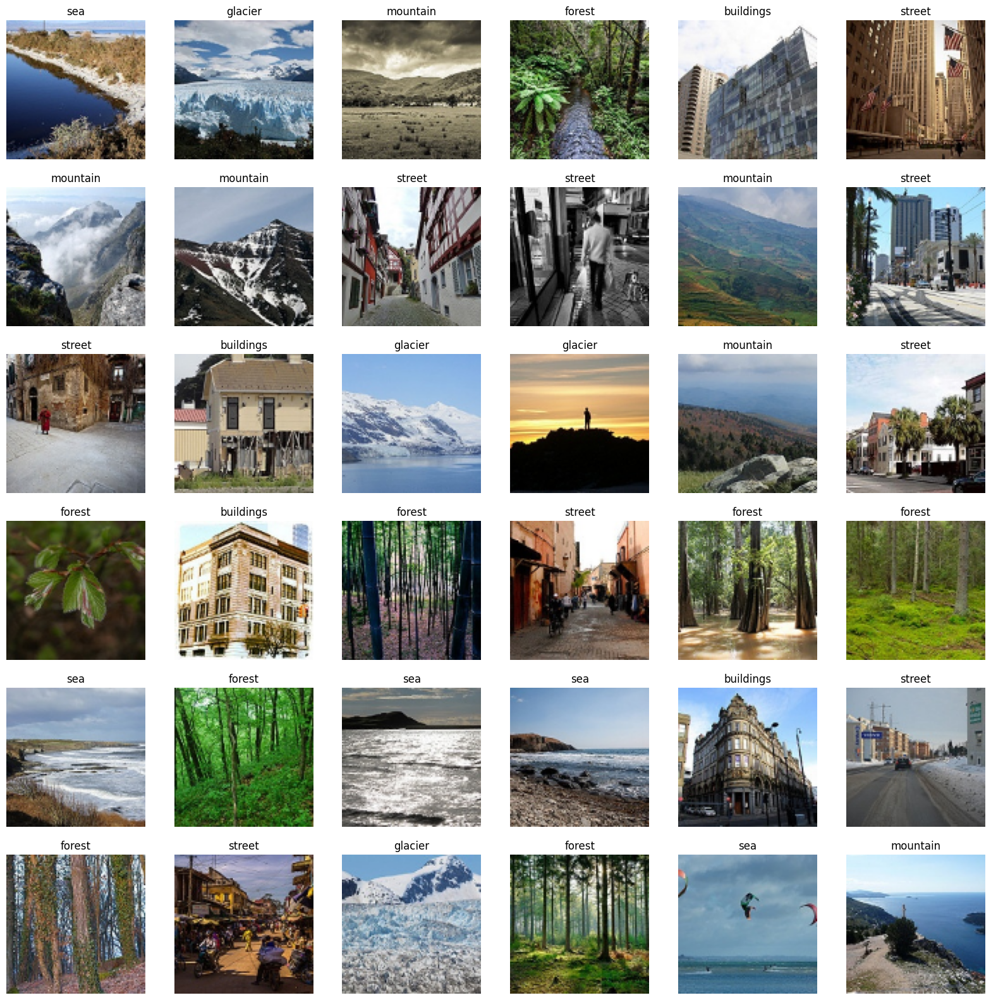

In [ ]:
plt.figure(figsize=(20,20))
for n ,i in enumerate(list(np.random.randint(0,len(x_train),36))):
  plt.subplot(6,6,n+1)
  plt.imshow(x_train[i])
  plt.axis('off')
  plt.title(getcode(y_train[i]))


In [30]:
x_test=[]
y_test=[]
for folder in os.listdir(test_path):
  files=gb.glob(pathname=str(test_path +f"/{folder}/"+'/*.jpg'))
  for img in files:
    image=plt.imread(img)
    image_arr=cv2.resize(image,(s,s))
    x_test.append(list(image_arr))
    y_test.append(code[folder])

In [ ]:
print(f' {len(x_test)} images in x_train')

 3000 images in x_train


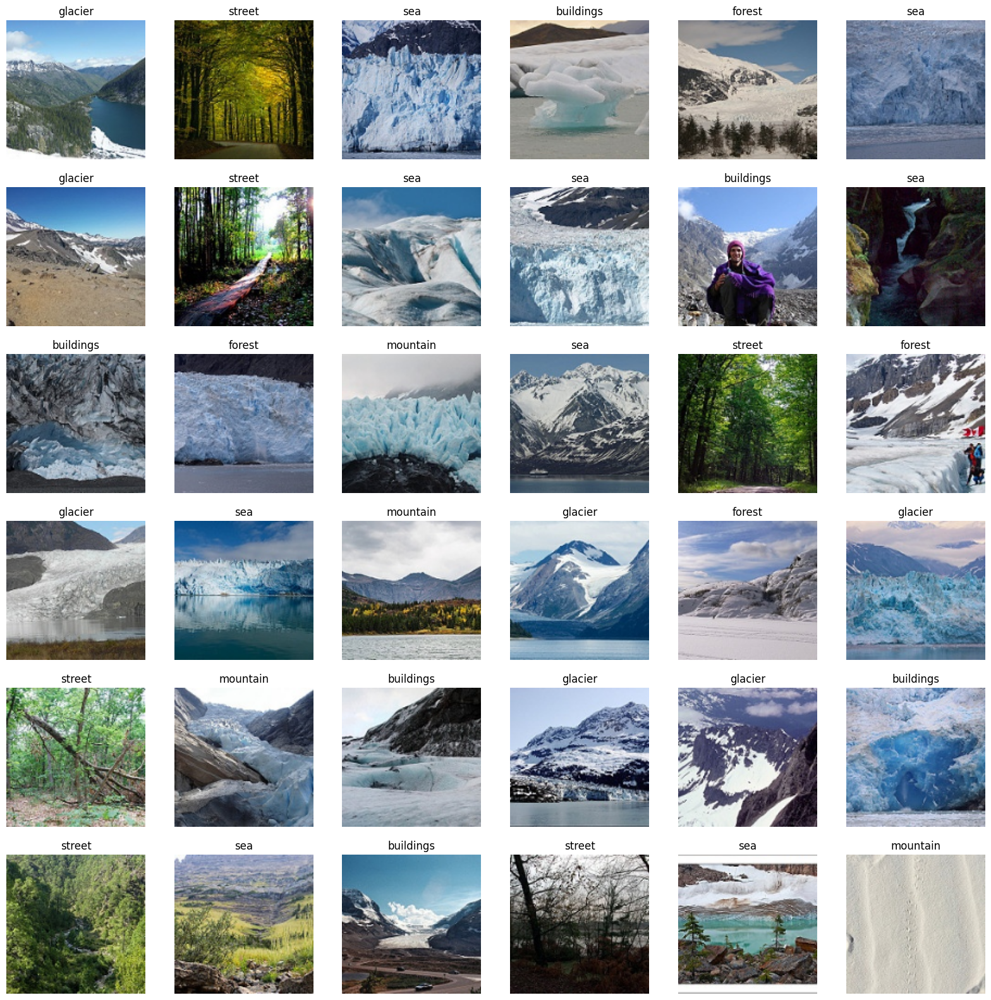

In [ ]:
plt.figure(figsize=(20,20))
for n ,i in enumerate(list(np.random.randint(0,len(x_test),36))):
  plt.subplot(6,6,n+1)
  plt.imshow(x_train[i])
  plt.axis('off')
  plt.title(getcode(y_test[i]))


In [9]:
x_pred=[]
files=gb.glob(pathname=str(pred_path +'/*.jpg'))
for img in files:
  image=plt.imread(img)
  image_arr=cv2.resize(image,(s,s))
  x_pred.append(list(image_arr))

In [ ]:
print(f' {len(x_pred)} images in x_predict')

 7301 images in x_predict


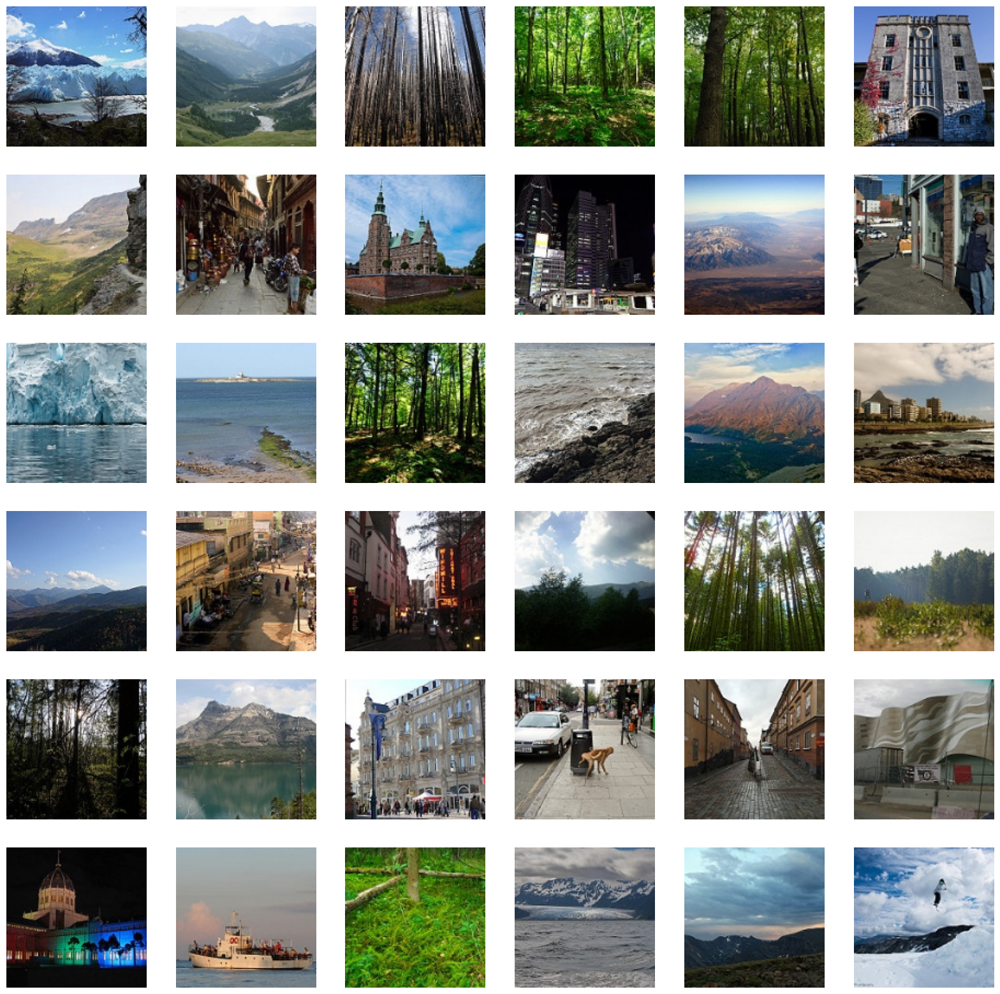

In [ ]:
plt.figure(figsize=(20,20))
for n ,i in enumerate(list(np.random.randint(0,len(x_pred),36))):
  plt.subplot(6,6,n+1)
  plt.imshow(x_pred[i])
  plt.axis('off')

In [31]:
from tensorflow.keras.utils import to_categorical
y_test = to_categorical(y_test)

In [32]:
x_train=np.array(x_train)
y_train=np.array(y_train)
x_test=np.array(x_test)
y_test=np.array(y_test)
x_pred_array=np.array(x_pred)

In [33]:
print(f'x_train shape {x_train.shape}')
print(f'x_test shape {x_test.shape}')
print(f'x_predict shape {x_pred_array.shape}')
print(f'y_train shape {y_train.shape}')
print(f'y_test shape {y_test.shape}')


x_train shape (14034, 100, 100, 3)
x_test shape (3000, 100, 100, 3)
x_predict shape (7301, 100, 100, 3)
y_train shape (14034,)
y_test shape (3000, 6)


In [ ]:
es =  EarlyStopping(monitor='val_loss', patience=8, verbose=1, restore_best_weights=True)

In [12]:
model = Sequential([
    Conv2D(32, (5, 5), activation='leaky_relu', padding='Same', input_shape=(s, s, 3)),
    BatchNormalization(),
    Conv2D(32, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),


    Conv2D(64, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    Conv2D(64, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),

    Conv2D(128, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    Conv2D(128, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),

    Conv2D(256, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    Conv2D(256, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.2),

    Conv2D(512, (5, 5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    Conv2D(512, (5,5), activation='leaky_relu', padding='Same'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.4),

    GlobalAveragePooling2D(),

    Dense(256, activation='leaky_relu'),
    Dense(128, activation='leaky_relu'),
    Dropout(0.5),
    Dense(64, activation='leaky_relu'),
    Dropout(0.5),
    Dense(32, activation='leaky_relu'),
    Dense(6, activation='softmax'),
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
optimizer = Adam(learning_rate=0.001, epsilon=1e-08)
model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics=['accuracy'])



In [14]:
LRR=ReduceLROnPlateau(monitor='val_acc',
                      patience=4,
                      verbose=1,
                      factor=0.5,
                      min_lr=0.00001)

In [15]:
print('Model Detailes are : ')
print(model.summary())

Model Detailes are : 


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 100, 100, 32)        │           2,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 100, 100, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 100, 100, 32)        │          25,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 100, 100, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 50, 50, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 50, 50, 64)          │          51,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 50, 50, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 50, 50, 64)          │         102,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 50, 50, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 25, 25, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 25, 25, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 25, 25, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 25, 25, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 25, 25, 128)         │         409,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 25, 25, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 12, 12, 256)         │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 13,268,678 (50.62 MB)

 Trainable params: 13,264,710 (50.60 MB)

 Non-trainable params: 3,968 (15.50 KB)

None


In [16]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=5,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images


datagen.fit(x_train)

In [18]:
epochs = 100
batch_size=256
history = model.fit(datagen.flow(x_train,y_train,batch_size=batch_size),epochs=epochs,verbose=1,validation_data = (x_test,y_test),
                    steps_per_epoch=x_train.shape[0] // batch_size,callbacks=[LRR])

Epoch 1/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 153s 2s/step - accuracy: 0.8966 - loss: 0.3043 - val_accuracy: 0.8927 - val_loss: 0.3288 - learning_rate: 0.0010
Epoch 2/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.9375 - loss: 0.2033 - val_accuracy: 0.8923 - val_loss: 0.3282 - learning_rate: 0.0010
Epoch 3/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 94s 852ms/step - accuracy: 0.9213 - loss: 0.2362 - val_accuracy: 0.8950 - val_loss: 0.3221 - learning_rate: 0.0010
Epoch 4/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.9258 - loss: 0.2109 - val_accuracy: 0.8957 - val_loss: 0.3219 - learning_rate: 0.0010
Epoch 5/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 77s 850ms/step - accuracy: 0.9264 - loss: 0.2215 - val_accuracy: 0.8980 - val_loss: 0.3225 - learning_rate: 0.0010
Epoch 6/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - accuracy: 0.9102 - loss: 0.3007 - val_accuracy: 0.8983 - val_loss: 0.3222 - learning_rate: 0.0010
Epoch 7/100
54/54 ━━━━━━━━━━━━━━━━━━━━ 52s 883ms/step - accuracy: 0.9304 - loss: 0.2

In [26]:
import pickle

In [27]:
pickle.dump(model,open('model_cnn','wb'))

In [21]:
model_loss,model_accuracy=model.evaluate(x_test,y_test)
print(f'test loss is  : {model_loss}')
print(f'test accuracy is : {model_accuracy}')

94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.8880 - loss: 0.4202
test loss is  : 0.3772414028644562
test accuracy is : 0.8933333158493042


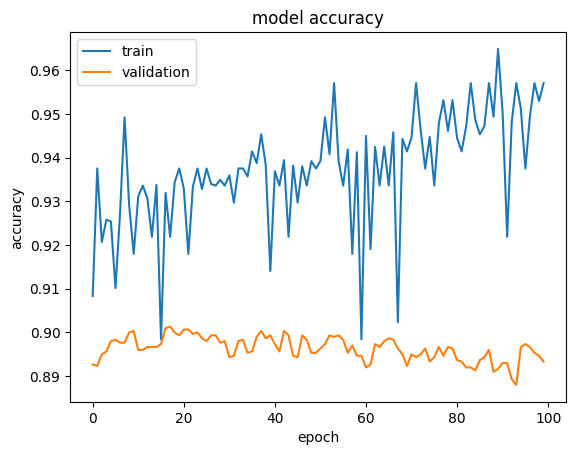

In [40]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()



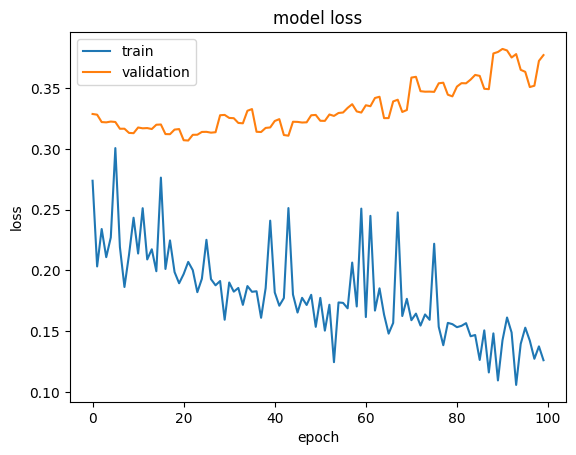

In [41]:
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [42]:
len(y_test), len(y_pred)

(3000, 3000)

In [46]:
def predict_image_show(image):
  org_image = image
  single_image = np.expand_dims(org_image, axis=0)
  predictions = model.predict(single_image)
  predict_class=np.argmax(predictions,axis=1)
  plt.imshow(image ,cmap='gray')
  plt.title(f'Predicted Class: {getcode(predict_class[0])}')
  plt.axis('off')
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


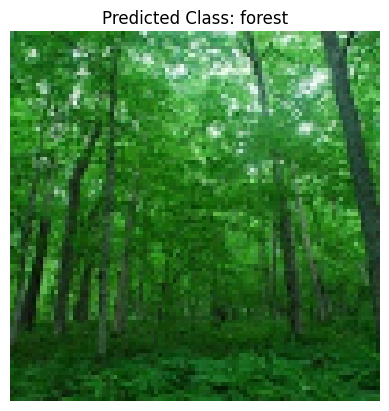

In [47]:
predict_image_show(x_pred[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


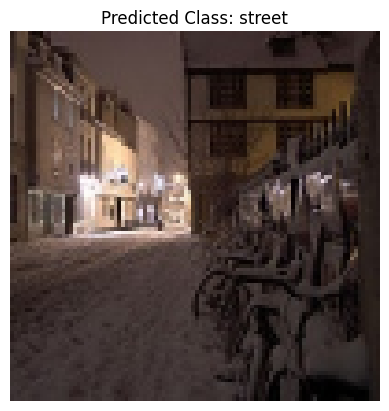

In [48]:
predict_image_show(x_pred[1400])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


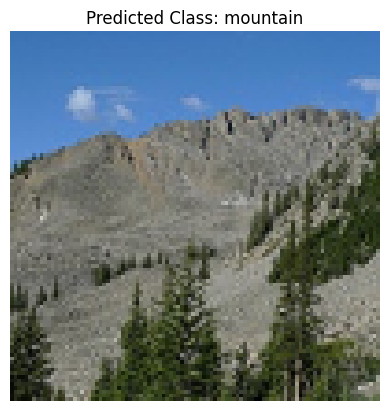

In [49]:
predict_image_show(x_pred[500])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


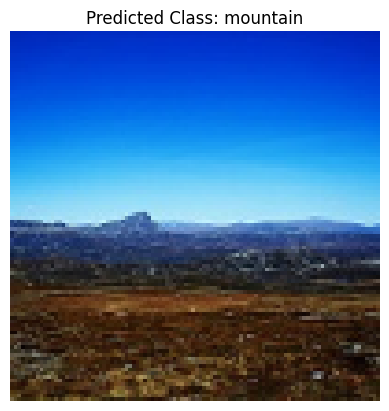

In [52]:
predict_image_show(x_pred[2050])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


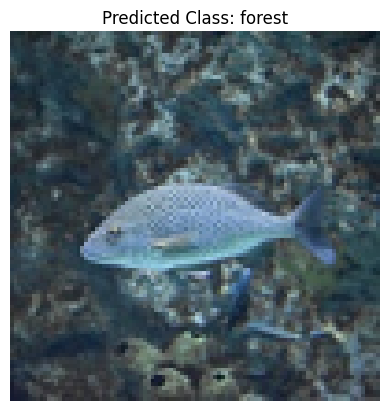

In [51]:
predict_image_show(x_pred[2500])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


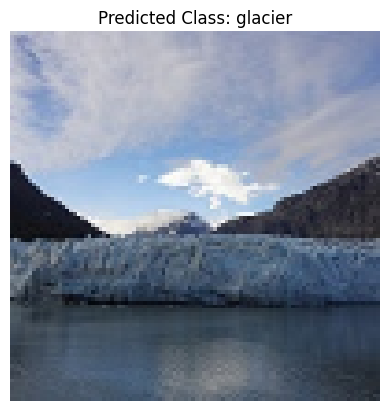

In [50]:
predict_image_show(x_pred[900])

In [ ]:
num_image